#### Cosmic (Outlier) Removal
- Medain Filter
- Savitzky Golay Filter
- Rolling Mean Filter
- Rampy Despiking

In [3]:
import pandas as pd
import numpy as np
# import plotly.graph_objects as go
from scipy.signal import medfilt, savgol_filter
import rampy as rp
import numpy as np
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv("./combined_spectra.csv")

In [5]:
x_values = df.iloc[:, 0] #first column
df_data = df.iloc[:, 1:]
df_original = df_data.copy()

In [6]:
df.head()

,x,Enterobacter_aerogenes_1_s1,Enterobacter_aerogenes_1_s2,Enterobacter_aerogenes_1_s3,Enterobacter_aerogenes_1_s4,Enterobacter_aerogenes_1_s5,Enterobacter_aerogenes_1_s6,Enterobacter_aerogenes_1_s7,Enterobacter_aerogenes_1_s8,Enterobacter_aerogenes_1_s9,...,S_abony_3_s23,S_abony_3_s24,S_abony_3_s25,S_abony_3_s26,S_abony_3_s27,S_abony_3_s28,S_abony_3_s29,S_abony_3_s30,S_abony_3_s31,S_abony_3_s32
0,542.245,462.8,463.8,464.6,463.0,466.8,464.2,467.8,466.8,466.0,...,505.8,509.6,552.0,511.4,504.8,502.8,479.6,477.8,486.6,487.0
1,542.328,464.4,460.6,462.4,464.2,468.2,467.8,464.8,462.8,467.8,...,497.6,509.6,550.2,517.8,503.8,500.4,480.4,480.0,483.6,490.6
2,542.411,464.0,462.6,462.4,465.0,467.6,466.2,465.4,464.8,471.4,...,501.8,513.6,546.6,514.6,503.2,497.2,483.4,478.6,486.2,487.0
3,542.493,462.6,461.0,460.4,463.0,463.8,466.2,465.2,466.0,469.8,...,502.8,507.4,547.4,517.8,501.6,493.2,480.0,472.8,486.0,489.2
4,542.576,461.8,461.0,461.4,467.4,465.8,466.4,467.2,467.0,469.2,...,502.0,508.6,547.8,510.6,499.2,497.2,477.6,472.8,481.4,489.0


In [10]:
df_median = df_data.apply(lambda x: medfilt(x, kernel_size=9))

In [11]:
df_savgol = df_data.apply(lambda x: savgol_filter(x, window_length=9, polyorder=3))

In [14]:
df_rolling = df_data.rolling(window=10, min_periods=5).mean()

In [22]:
df_despiked_smoothed = pd.DataFrame()
for column in df_median.columns:
    y = df_savgol[column].to_numpy()
    # num_rows = df.shape[0]
    # x = np.zeros(num_rows)
    # x = df.iloc[:, 0].to_numpy()
    x = x_values.to_numpy()
    y_despiked = rp.despiking(x, y, 3)  
    # Smoothing
    # y_smoothed = rp.smooth(x, y, ) 
    df_despiked_smoothed[column] = y_despiked

c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19556\2825754760.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_despiked_smoothed[column] = y_despiked
C:\Users\Admin\AppData\Local\Temp\ipykernel_19556\2825754760.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

Text(0, 0.5, 'Intensity')

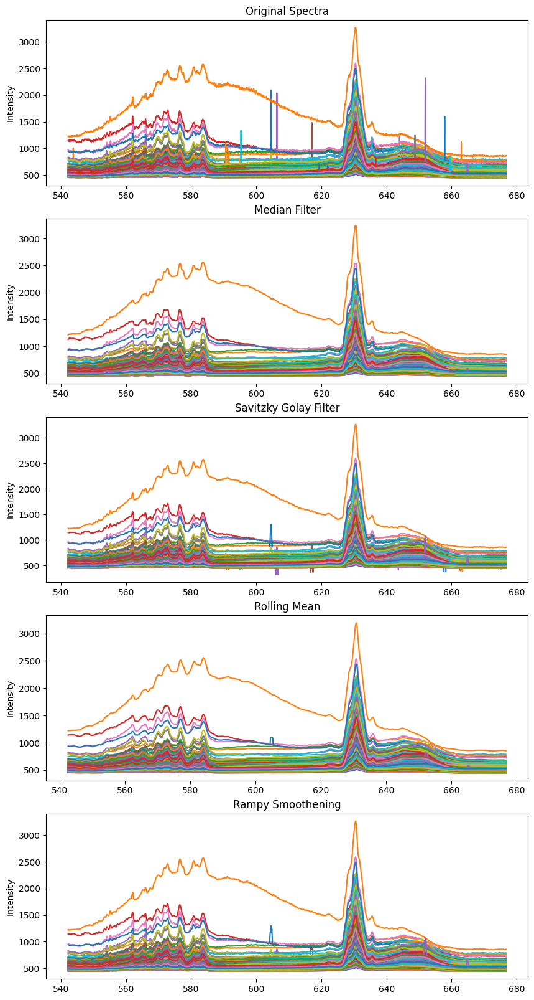

In [23]:
fig, axes = plt.subplots(5, 1, figsize=(10, 20))
for column in df_data.columns:
    axes[0].plot(x_values, df_data[column], label=f'Raman Shift')
axes[0].set_title("Original Spectra")
axes[0].set_ylabel("Intensity")
# axes[0].legend(loc='upper right', fontsize='small')



for column in df_median.columns:
    axes[1].plot(x_values, df_median[column], label=f'Raman Shift')
axes[1].set_title("Median Filter")
axes[1].set_ylabel("Intensity")
# axes[1].legend(loc='upper right', fontsize='small')



for column in df_savgol.columns:
    axes[2].plot(x_values, df_savgol[column], label=f'Raman Shift')
axes[2].set_title("Savitzky Golay Filter")
axes[2].set_ylabel("Intensity")
# axes[2].legend(loc='upper right', fontsize='small')




for column in df_rolling.columns:
    axes[3].plot(x_values, df_rolling[column], label=f'Raman Shift')
axes[3].set_title("Rolling Mean")
axes[3].set_ylabel("Intensity")
# axes[3].legend(loc='upper right', fontsize='small')



for column in df_despiked_smoothed.columns:
    axes[4].plot(x_values, df_despiked_smoothed[column], label=f'Raman Shift')
axes[4].set_title("Rampy Smoothening")
axes[4].set_ylabel("Intensity")
# axes[4].legend(loc='upper right', fontsize='small')


In [ ]:
plt.tight_layout()
plt.savefig("cosmic_removal_comparison.png")

In [6]:
fig = go.Figure()
for column in df_original.columns:
    fig.add_trace(go.Scatter(x=x_values, y=df_original[column], mode='lines', name=f'Original - {column}'))
fig.update_layout(
    title="Original spectra",
    xaxis_title="X-Axis (e.g., Wavelength)",
    yaxis_title="Intensity",
    legend_title="Method",
    height=600
)
fig.show()

**Median Filter**
- The median filter slides a window of fixed size across the data.
- It sorts the data within the window and replaces the central data point with the median value of the sorted data. 
- This process is repeated across the entire data set.
- Excels at removing outliers and preserving edges but may not preserve finer details as well as the Savitzky-Golay filter.

In [8]:
df_median = df_data.apply(lambda x: medfilt(x, kernel_size=9))
fig = go.Figure()
for column in df_median.columns:
    fig.add_trace(go.Scatter(x=x_values, y=df_median[column], mode='lines', name=f'Median Filter - {column}'))
fig.update_layout(
    title="Median filter",
    xaxis_title="Raman Shift",
    yaxis_title="Intensity",
    legend_title="Method",
    height=600
)

fig.show()

**Savitzky Golay Filter**
- The Savitzky-Golay filter is a digital filter used to smooth a set of data points by fitting successive sub-sets of adjacent data points with a low-degree polynomial using the method of least squares.
- The filter works by sliding a window of a fixed size (e.g., 5, 7, 9 points) across the data, fitting a polynomial (typically of 2nd or 3rd degree) to the data within that window, and then replacing the central point in the window with the value of the polynomial at that point. This process is repeated for every data point in the signal.

In [5]:
df_savgol = df_data.apply(lambda x: savgol_filter(x, window_length=9, polyorder=3))
fig = go.Figure()
for column in df_savgol.columns:
    fig.add_trace(go.Scatter(x=x_values, y=df_savgol[column], mode='lines', name=f'Savitzky-Golay - {column}'))
fig.update_layout(
    title="Sav-Gol filter",
    xaxis_title="X-Axis (e.g., Wavelength)",
    yaxis_title="Intensity",
    legend_title="Method",
    height=600
)

fig.show()

**Rolling Mean**
- The rolling mean filter, also known as a moving average filter, is a straightforward technique used to smooth data by averaging a subset of adjacent data points.
- The filter operates by sliding a window of a fixed size across the data points. For each position of the window, it calculates the average (mean) of the data points within that window and replaces the central point in the window with this average value. The window then moves one point forward, and the process repeats until the entire dataset has been smoothed.

In [10]:
df_rolling = df_data.rolling(window=20, min_periods=7).mean()
fig = go.Figure()
for column in df_rolling.columns:
    fig.add_trace(go.Scatter(x=x_values, y=df_rolling[column], mode='lines', name=f'Rolling Mean - {column}'))
fig.update_layout(
    title="Rolling mean",
    xaxis_title="X-Axis (e.g., Wavelength)",
    yaxis_title="Intensity",
    legend_title="Method",
    height=600
)

fig.show()

In [17]:
from numpy.polynomial import Polynomial
df_baseline_corrected = pd.DataFrame()

for column in df_median.columns:
    p = Polynomial.fit(x_values, df_median[column], deg=3)
    baseline = p(x_values)
    corrected_signal = df_median[column] - baseline
    df_baseline_corrected[column] = corrected_signal
df_normalized = pd.DataFrame()

for column in df_baseline_corrected.columns:
    min_val = df_baseline_corrected[column].min()
    max_val = df_baseline_corrected[column].max()
    normalized_signal = (df_baseline_corrected[column] - min_val) / (max_val - min_val)
    df_normalized[column] = normalized_signal

fig = go.Figure()

for column in df_baseline_corrected.columns:
    fig.add_trace(go.Scatter(x=x_values, y=df_baseline_corrected[column], mode='lines', name=f'Baseline Corrected - {column}', line=dict(dash='dot')))

for column in df_normalized.columns:
    fig.add_trace(go.Scatter(x=x_values, y=df_normalized[column], mode='lines', name=f'Normalized - {column}'))

fig.update_layout(
    title="Baseline Correction and Min-Max Normalization",
    xaxis_title="X-Axis (e.g., Wavelength)",
    yaxis_title="Intensity",
    legend_title="Method",
    height=600
)
fig.show()